# MODEL 5 - MobileNetV3 with feature vector euclidian distance


In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import os

import pandas as pd
import tensorflow as tf
import numpy as np
import tensorflow.keras as keras
from tensorflow.python.data import AUTOTUNE
from tensorflow.keras import layers as kl
from tensorflow.keras import losses
from tensorflow.keras import optimizers
from tensorflow.keras import callbacks as cb
import tensorflow_addons as tfa

from src.math.euclidian_distance import euclidian_distance
from src.nn.losses.contrastive_loss import contrastive_loss


if os.getcwd().startswith("/Users"): os.chdir(os.getcwd().replace("/notebooks", ""))

from src.config.notebook_config import NotebookConfig

from src.evaluation.evaluation import Evaluation

from src.data.utility.tf_dataset_transformer import TfDatasetTransformer


%load_ext autoreload
%autoreload 2

# Config

In [2]:
MODEL_NAME = "model_5-b"

config = NotebookConfig(MODEL_NAME)

import src.data.dataset.dataset_v2_loader as dataset_loader # V2
DATASET_LOADER = dataset_loader

BATCH_SIZE = 64

# Data Loading

In [3]:
train_dataset = DATASET_LOADER.load_train_v2()
val_dataset = DATASET_LOADER.load_validation_v2()

In [4]:
pair_tuples = list(map(lambda pair: (pair.image_a, pair.image_b, pair.similar), train_dataset.image_pairs))
pair_array = np.array(pair_tuples)


tf_dataset_transformer =  TfDatasetTransformer(image_shape=config.image_shape)

train_tf_dataset = tf_dataset_transformer.transform_to_tf_dataset(train_dataset, shuffle=True, shuffle_buffer_size=512)\
                                         .cache("./tf_cache/train_dataset")\
                                         .batch(BATCH_SIZE)\
                                         .prefetch(AUTOTUNE)

val_tf_dataset = tf_dataset_transformer.transform_to_tf_dataset(val_dataset)\
                                         .cache("./tf_cache/val_dataset")\
                                         .batch(128)\
                                         .prefetch(AUTOTUNE)

2022-04-03 20:46:08.968802: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Model

In [8]:
model = None

In [9]:
def create_common_model() -> keras.Model:
    mobnet = keras.applications.MobileNetV3Large(input_shape=config.image_shape.to_shape(), include_top=False, pooling=None, dropout_rate=0.2)
    mobnet.trainable = False

    input = keras.Input(shape=config.image_shape.to_shape())
    x = mobnet(input, training=False)
    x = kl.AveragePooling2D(pool_size=7)(x)
    x = kl.Conv2D(filters=256, kernel_size=1, activation="swish")(x)
    x = kl.Flatten()(x)
    x = kl.BatchNormalization()(x)
    x = kl.Dense(128, activation="tanh")(x)
    return keras.Model(inputs=input, outputs=x)


def create_model() -> keras.Model:
    input_a = keras.Input(shape=config.image_shape.to_shape())
    input_b = keras.Input(shape=config.image_shape.to_shape())

    common_model = create_common_model()

    print(common_model.summary())

    layer_a = common_model(input_a)
    layer_b = common_model(input_b)

    merge_layer = kl.Lambda(euclidian_distance)([layer_a, layer_b])
    merge_layer = kl.BatchNormalization()(merge_layer)
    merge_layer = kl.Dense(1, activation="sigmoid")(merge_layer)

    return keras.Model(inputs=[input_a, input_b], outputs=merge_layer, name=MODEL_NAME)


metric_f1 = tfa.metrics.f_scores.F1Score(num_classes=1, average="micro", name="f1-micro")
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=0.01, decay_steps=727, decay_rate=0.75)

model = create_model()
model.compile(
    optimizer=optimizers.Adam(learning_rate=lr_schedule), loss=losses.CategoricalHinge(), metrics=["accuracy", metric_f1])


model.summary()

12697600/12683000 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 MobilenetV3large (Functiona  (None, 7, 7, 960)        2996352   
 l)                                                              
                                                                 
 average_pooling2d (AverageP  (None, 1, 1, 960)        0         
 ooling2D)                                                       
                                                                 
 conv2d (Conv2D)             (None, 1, 1, 256)         246016    
                                                                 
 flatten (Flatten)           (None, 256)               0         
                                                              

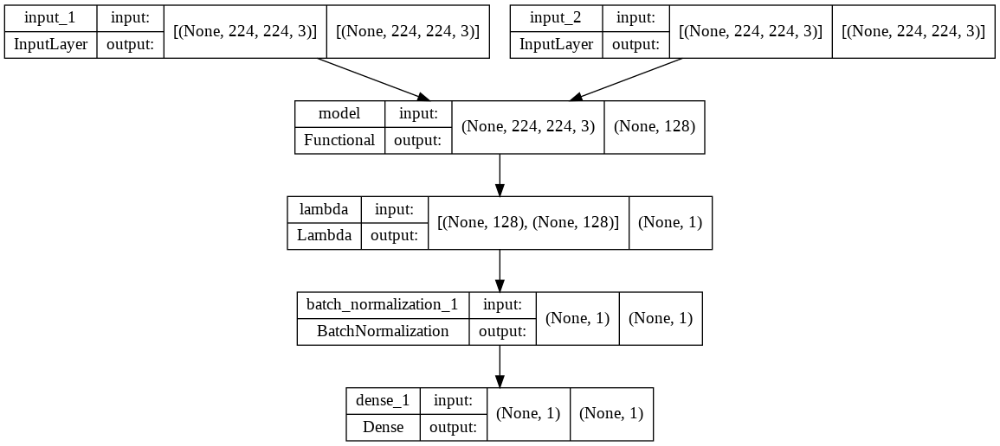

In [10]:
keras.utils.plot_model(model, show_shapes=True, expand_nested=False)

Epoch 1/40
726/726 [==============================] - 523s 693ms/step - loss: 0.7063 - accuracy: 0.7778 - f1-micro: 0.6998 - val_loss: 0.6530 - val_accuracy: 0.8064 - val_f1-micro: 0.7047
Epoch 2/40
726/726 [==============================] - 405s 559ms/step - loss: 0.6575 - accuracy: 0.8088 - f1-micro: 0.7020 - val_loss: 0.6537 - val_accuracy: 0.8052 - val_f1-micro: 0.7168
Epoch 3/40
726/726 [==============================] - 787s 1s/step - loss: 0.6515 - accuracy: 0.8138 - f1-micro: 0.7193 - val_loss: 0.6459 - val_accuracy: 0.8112 - val_f1-micro: 0.7327
Epoch 4/40
726/726 [==============================] - 761s 1s/step - loss: 0.6440 - accuracy: 0.8196 - f1-micro: 0.7376 - val_loss: 0.6432 - val_accuracy: 0.8146 - val_f1-micro: 0.7463
Epoch 5/40
726/726 [==============================] - 761s 1s/step - loss: 0.6360 - accuracy: 0.8279 - f1-micro: 0.7534 - val_loss: 0.6405 - val_accuracy: 0.8166 - val_f1-micro: 0.7690
Epoch 6/40
726/726 [==============================] - 733s 1s/step - 

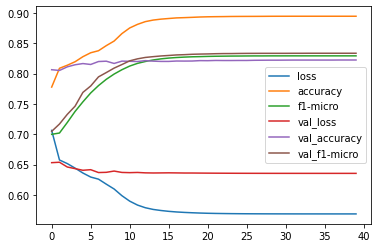

In [11]:
save_cb = cb.ModelCheckpoint(config.model_output_path, save_best_only=True)
tensorboard_cb = cb.TensorBoard(log_dir=config.tensorboard_log_dir)

history = model.fit(train_tf_dataset, epochs=40, workers=8, max_queue_size=20, validation_data=val_tf_dataset, callbacks=[save_cb, tensorboard_cb])

pd.DataFrame(history.history).plot()

In [ ]:
import gc
gc.collect(2)#%%

33302

# Evaluation

In [5]:
model: keras.Model = keras.models.load_model(config.saved_model_path)

In [6]:
evaluation = Evaluation(dataset=val_dataset, image_shape=config.image_shape, model=model)

42/42 [==============================] - 229s 5s/step
              precision    recall  f1-score   support

       False       0.83      0.77      0.80      4890
        True       0.82      0.87      0.84      5834

    accuracy                           0.82     10724
   macro avg       0.82      0.82      0.82     10724
weighted avg       0.82      0.82      0.82     10724

Regular pairs:
              precision    recall  f1-score   support

       False       1.00      1.00      1.00      2681
        True       1.00      1.00      1.00      2681

    accuracy                           1.00      5362
   macro avg       1.00      1.00      1.00      5362
weighted avg       1.00      1.00      1.00      5362

Augmented pairs:
              precision    recall  f1-score   support

       False       0.58      0.50      0.54      2209
        True       0.68      0.75      0.71      3153

    accuracy                           0.65      5362
   macro avg       0.63      0.63      0.6

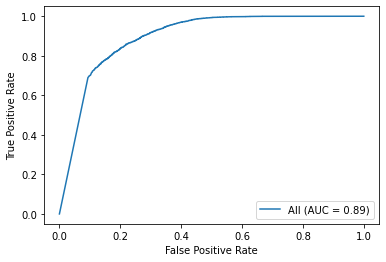

In [7]:
evaluation.print_f1_report(threshold=0.5)
evaluation.print_separate_f1_reports(threshold=0.5)
evaluation.plot_roc()

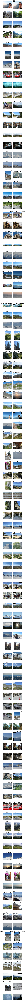

In [8]:
evaluation.show_images(range(8000, 8100))